## **Importing Necessary Libraries**

In [1]:
import math
import numpy as np
import pandas as pd
import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.colors as colors
import contextily as ctx
import warnings

warnings.filterwarnings("ignore")

import scikit_posthocs as sp
from scipy.stats import shapiro

## **Importing Preprocessed Dataset**

In [2]:
nyc_clean = pd.read_csv('nyc_clean.csv')

In [3]:
nyc_clean.head()

,VendorID,lpep_pickup_datetime,pickup_date,pickup_time,pickup_hour,pickup_period,pickup_dayofweek,pickup_month,pickup_year,is_weekend_pickup,...,trip_type,congestion_surcharge,speed_mph,fare_per_mile,precipitation,snowfall,snowdepth,avg_temp,max_temp,min_temp
0,2,2023-01-01 00:01:31,2023-01-01,00:01:31,0,AM,Sunday,1,2023,1,...,1.0,0.00,10.250287,6.572581,0.0,0.0,0.0,11.1,12.8,9.4
1,2,2023-01-01 00:04:25,2023-01-01,00:04:25,0,AM,Sunday,1,2023,1,...,1.0,0.00,12.521739,5.821429,0.0,0.0,0.0,11.1,12.8,9.4
2,2,2023-01-01 00:08:05,2023-01-01,00:08:05,0,AM,Sunday,1,2023,1,...,1.0,0.00,11.775701,5.238095,0.0,0.0,0.0,11.1,12.8,9.4
3,2,2023-01-01 00:08:43,2023-01-01,00:08:43,0,AM,Sunday,1,2023,1,...,1.0,2.75,14.186139,5.728643,0.0,0.0,0.0,11.1,12.8,9.4
4,1,2023-01-01 00:09:14,2023-01-01,00:09:14,0,AM,Sunday,1,2023,1,...,1.0,2.75,13.090909,5.026316,0.0,0.0,0.0,11.1,12.8,9.4


In [4]:
nyc_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57461 entries, 0 to 57460
Data columns (total 52 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   VendorID               57461 non-null  int64  
 1   lpep_pickup_datetime   57461 non-null  object 
 2   pickup_date            57461 non-null  object 
 3   pickup_time            57461 non-null  object 
 4   pickup_hour            57461 non-null  int64  
 5   pickup_period          57461 non-null  object 
 6   pickup_dayofweek       57461 non-null  object 
 7   pickup_month           57461 non-null  int64  
 8   pickup_year            57461 non-null  int64  
 9   is_weekend_pickup      57461 non-null  int64  
 10  lpep_dropoff_datetime  57461 non-null  object 
 11  dropoff_date           57461 non-null  object 
 12  dropoff_time           57461 non-null  object 
 13  dropoff_hour           57461 non-null  int64  
 14  dropoff_period         57461 non-null  object 
 15  dr

In [5]:
items = [[
    column,
    nyc_clean[column].dtypes,
    len(nyc_clean[column]),
    nyc_clean[column].isnull().sum(),
    round(
        number=nyc_clean[column].isnull().sum()/len(nyc_clean[column])*100,
        ndigits=2
    ),
    nyc_clean[column].nunique(),
    list(nyc_clean[column].unique()[:5]) 
] for column in nyc_clean.columns]

# create a dataframe to display the attributes
data_info = pd.DataFrame(
    data=items,
    columns=[
        'Column',
        'Data Type',
        'Total Rows',
        'Total Missing',
        '% Missing',
        'Total Unique',
        'Unique Sample',
    ]
)

data_info

,Column,Data Type,Total Rows,Total Missing,% Missing,Total Unique,Unique Sample
0,VendorID,int64,57461,0,0.00,2,"[2, 1]"
1,lpep_pickup_datetime,object,57461,0,0.00,56587,"[2023-01-01 00:01:31, 2023-01-01 00:04:25, 202..."
2,pickup_date,object,57461,0,0.00,31,"[2023-01-01, 2023-01-02, 2023-01-03, 2023-01-0..."
3,pickup_time,object,57461,0,0.00,38116,"[00:01:31, 00:04:25, 00:08:05, 00:08:43, 00:09..."
4,pickup_hour,int64,57461,0,0.00,24,"[0, 1, 2, 3, 4]"
5,pickup_period,object,57461,0,0.00,2,"[AM, PM]"
6,pickup_dayofweek,object,57461,0,0.00,7,"[Sunday, Monday, Tuesday, Wednesday, Thursday]"
7,pickup_month,int64,57461,0,0.00,1,[1]
8,pickup_year,int64,57461,0,0.00,1,[2023]
9,is_weekend_pickup,int64,57461,0,0.00,2,"[1, 0]"


## **Univariate Analysis**
Exploring each columns distribution and nature

In [6]:
# defining categorical and numerical columns
categorical_cols = ['VendorID', 'store_and_fwd_flag', 'is_weekend_pickup', 'is_weekend_dropoff', 'pickup_hour',
                    'pickup_period', 'pickup_dayofweek', 'pickup_month', 'dropoff_hour', 'dropoff_period',
                    'dropoff_dayofweek', 'dropoff_month', 'RatecodeID', 'payment_type', 'trip_type', 
                    'pickup_borough', 'dropoff_borough']
numerical_cols = ['passenger_count', 'trip_distance', 'trip_duration_min', 'tip_amount', 'fare_amount', 'total_amount',
                  'extra', 'mta_tax', 'tolls_amount', 'improvement_surcharge', 'congestion_surcharge', 'speed_mph', 
                  'fare_per_mile']

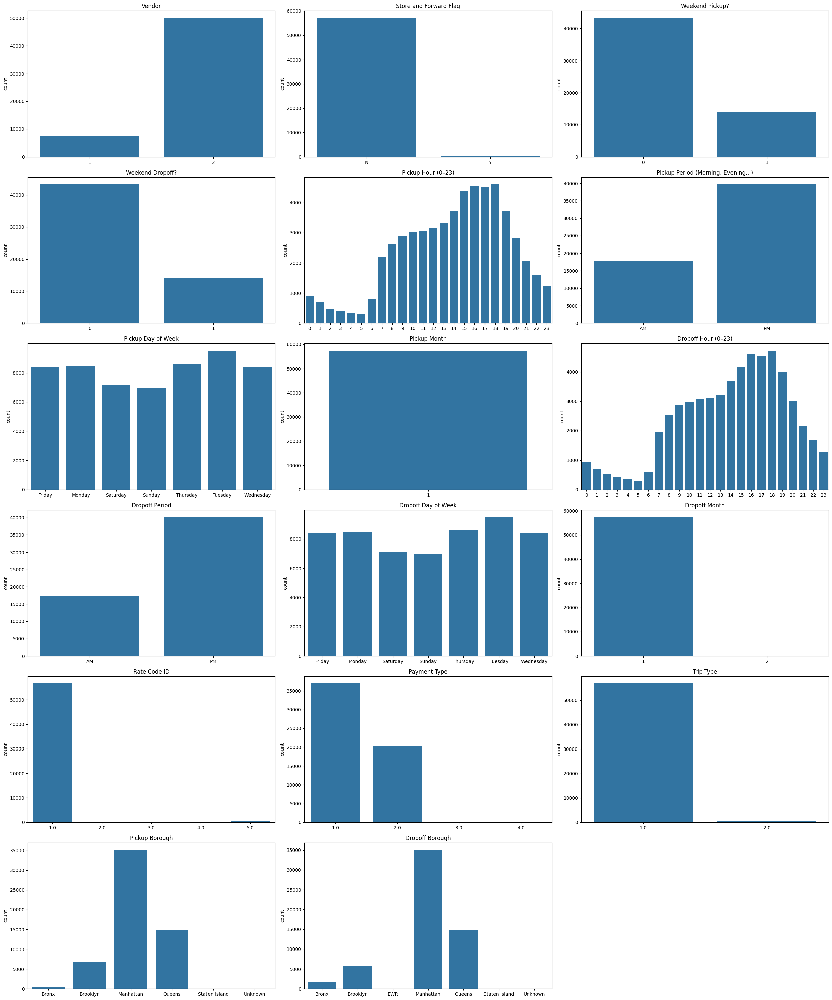

In [7]:
# Set up subplots for categorical variables
n_cols = 3
n_plots = len(categorical_cols)
n_rows = math.ceil(n_plots / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize = (25, 5 * n_rows))
axes = axes.flatten()  # Flatten to iterate easily

cat_titles = {
    'VendorID': 'Vendor',
    'store_and_fwd_flag': 'Store and Forward Flag',
    'is_weekend_pickup': 'Weekend Pickup?',
    'is_weekend_dropoff': 'Weekend Dropoff?',
    'pickup_hour': 'Pickup Hour (0–23)',
    'pickup_period': 'Pickup Period (Morning, Evening...)',
    'pickup_dayofweek': 'Pickup Day of Week',
    'pickup_month': 'Pickup Month',
    'dropoff_hour': 'Dropoff Hour (0–23)',
    'dropoff_period': 'Dropoff Period',
    'dropoff_dayofweek': 'Dropoff Day of Week',
    'dropoff_month': 'Dropoff Month',
    'RatecodeID': 'Rate Code ID',
    'payment_type': 'Payment Type',
    'trip_type': 'Trip Type',
    'pickup_borough': 'Pickup Borough',
    'dropoff_borough': 'Dropoff Borough'
}

for i, col in enumerate(categorical_cols):
    order = nyc_clean[col].value_counts().sort_index(ascending = True).index
    sns.countplot(x = col, data = nyc_clean, order = order, ax = axes[i])
    axes[i].set_title(cat_titles.get(col, col))
    axes[i].tick_params(axis = 'x', rotation = 0)
    axes[i].set_xlabel('')

# Hide unused subplots and center the last row
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])  # Delete unused subplot spaces

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()  # Display the plots

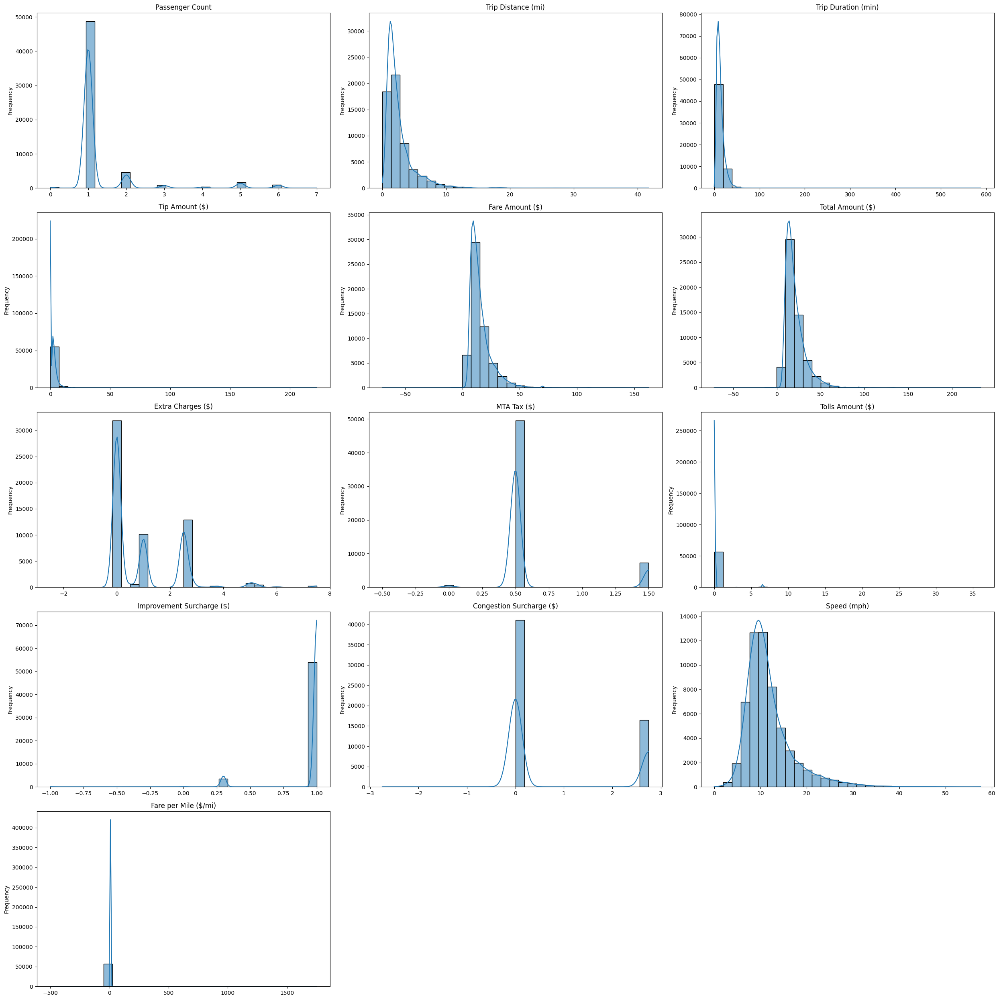

In [8]:
num_titles = {
    'passenger_count': 'Passenger Count',
    'trip_distance': 'Trip Distance (mi)',
    'trip_duration_min': 'Trip Duration (min)',
    'tip_amount': 'Tip Amount ($)',
    'fare_amount': 'Fare Amount ($)',
    'total_amount': 'Total Amount ($)',
    'extra': 'Extra Charges ($)',
    'mta_tax': 'MTA Tax ($)',
    'tolls_amount': 'Tolls Amount ($)',
    'improvement_surcharge': 'Improvement Surcharge ($)',
    'congestion_surcharge': 'Congestion Surcharge ($)',
    'speed_mph': 'Speed (mph)',
    'fare_per_mile': 'Fare per Mile ($/mi)'
}

# Grid layout setup
n_cols = 3
n_total = len(numerical_cols)
n_rows = math.ceil(n_total / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(25, 5 * n_rows))
axes = axes.flatten()

# Plot histograms for each numerical column
for i, col in enumerate(numerical_cols):
    sns.histplot(nyc_clean[col], kde=True, ax=axes[i], bins=30)
    axes[i].set_title(num_titles.get(col, col))
    axes[i].set_xlabel('')
    axes[i].set_ylabel('Frequency')

# Hide unused subplots and center the last row
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])  # Delete unused subplot spaces

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()  # Display the plots

In [9]:
# Step 1: Descriptive statistics
desc_stats = nyc_clean[numerical_cols].describe().T

# Step 2: Normality test
normality_results = []

for col in numerical_cols:
    # Drop NA for test
    data = nyc_clean[col].dropna()
    
    # Use Shapiro-Wilk test (good for < 5000 samples; take sample if needed)
    sample = data.sample(min(len(data), 5000), random_state=42)
    stat, p = shapiro(sample)
    
    normality_results.append({
        'column': col,
        'shapiro_statistic': stat,
        'shapiro_p_value': p,
        'is_normal': p > 0.05  # True = likely normal
    })

# Convert to DataFrame
normality_df = pd.DataFrame(normality_results).set_index('column')

# Step 3: Combine
summary_df = pd.concat([desc_stats, normality_df], axis=1)

# Optional: Rename columns for clarity
summary_df = summary_df.rename(columns={
    'count': 'Count',
    'mean': 'Mean',
    'std': 'Std Dev',
    'min': 'Min',
    '25%': 'Q1',
    '50%': 'Median',
    '75%': 'Q3',
    'max': 'Max',
    'shapiro_statistic': 'Shapiro-W',
    'shapiro_p_value': 'p-value',
    'is_normal': 'Normally Distributed?'
})

# Display
summary_df

,Count,Mean,Std Dev,Min,Q1,Median,Q3,Max,Shapiro-W,p-value,Normally Distributed?
passenger_count,57461.0,1.326761,0.995821,0.000000,1.000000,1.000000,1.000000,7.00,0.388510,1.461134e-84,False
trip_distance,57461.0,2.631602,2.259457,0.010000,1.260000,1.910000,3.160000,41.74,0.720725,4.617789e-68,False
trip_duration_min,57461.0,13.211956,8.735431,0.083333,7.583333,11.333333,16.633333,588.05,0.486831,1.033319e-80,False
tip_amount,57461.0,2.125967,2.855110,0.000000,0.000000,1.850000,3.360000,222.22,0.613888,1.165571e-74,False
fare_amount,57461.0,15.505932,9.365451,-70.000000,9.300000,12.800000,18.400000,162.60,0.794156,3.912306e-62,False
total_amount,57461.0,20.802845,11.681384,-71.500000,12.960000,17.650000,25.200000,232.72,0.787041,8.827494e-63,False
extra,57461.0,0.926206,1.316458,-2.500000,0.000000,0.000000,2.500000,7.50,0.708550,6.504786e-69,False
mta_tax,57461.0,0.620369,0.339445,-0.500000,0.500000,0.500000,0.500000,1.50,0.435938,8.893303e-83,False
tolls_amount,57461.0,0.119175,0.909471,0.000000,0.000000,0.000000,0.000000,36.05,0.103543,2.788681e-93,False
improvement_surcharge,57461.0,0.954969,0.177644,-1.000000,1.000000,1.000000,1.000000,1.00,0.254767,5.138926e-89,False


Based on the summary of the descriptive statistics and the normality test, it shows that none of the numerical columns are normally distributed.

## **Bivariate Analysis**

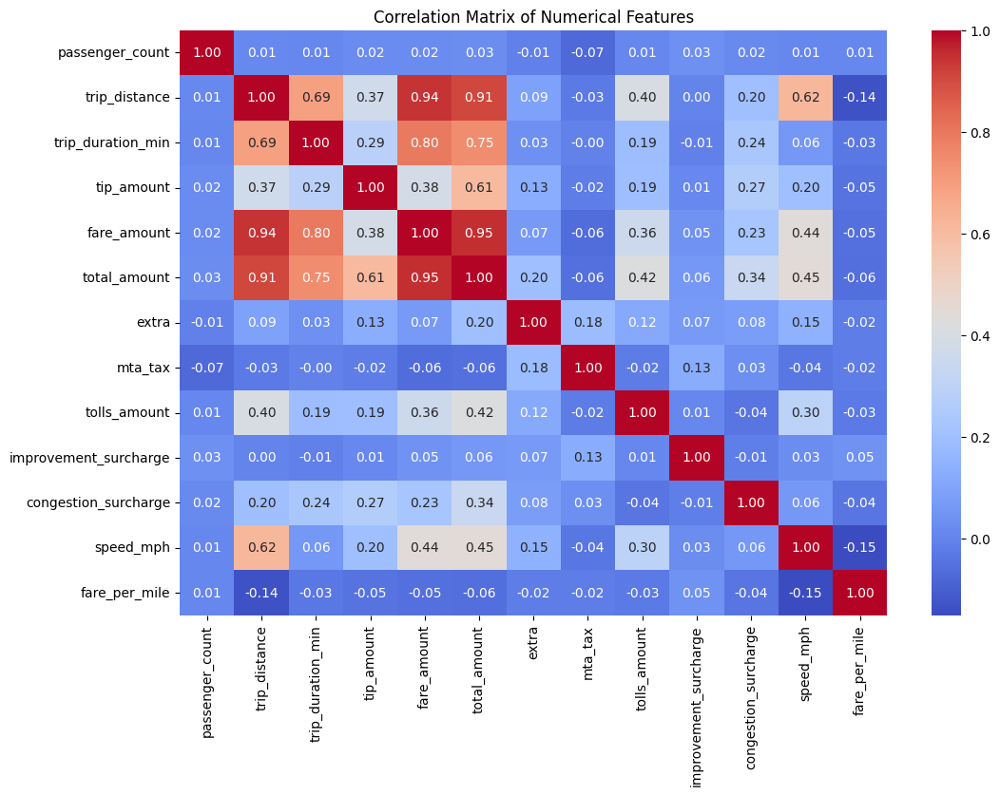

In [10]:
# Correlation Heatmap for numerical columns

plt.figure(figsize=(12, 8))
sns.heatmap(nyc_clean[numerical_cols].corr(), annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Correlation Matrix of Numerical Features")
plt.show()

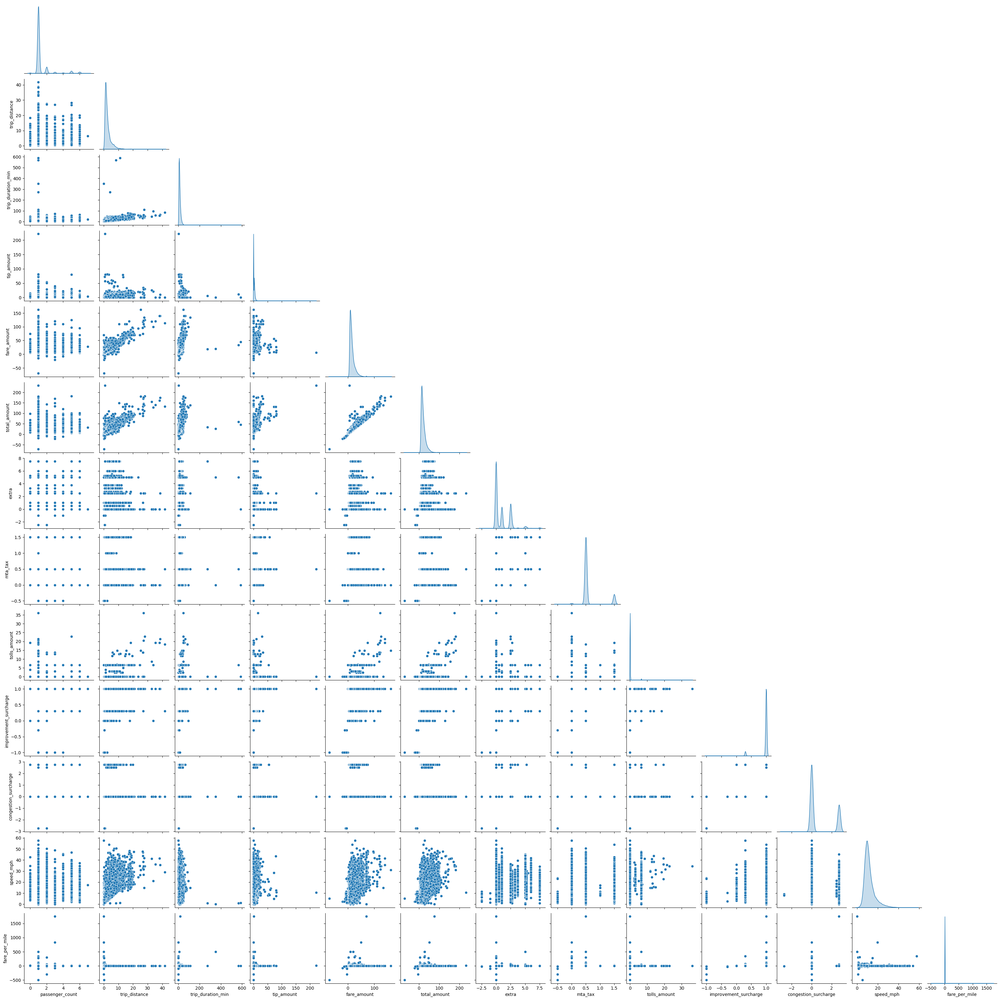

In [11]:
### Relationship Analysis - Pairwise Scatter Plots
sns.pairplot(nyc_clean[numerical_cols], corner=True, diag_kind='kde')
plt.show()

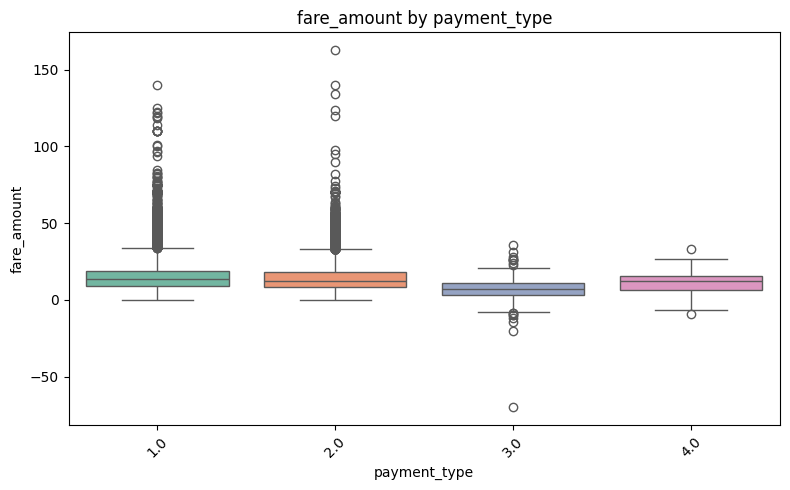

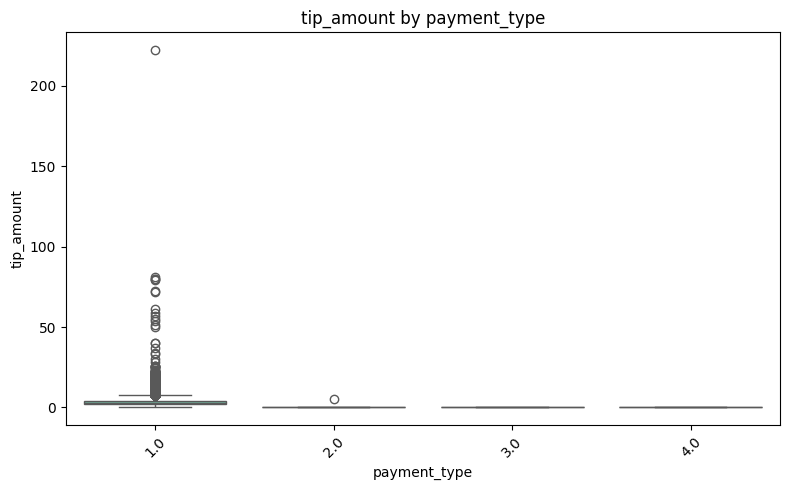

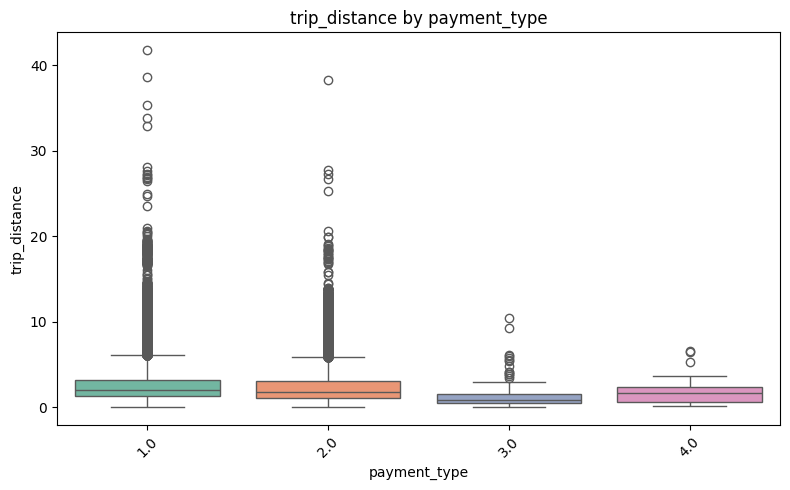

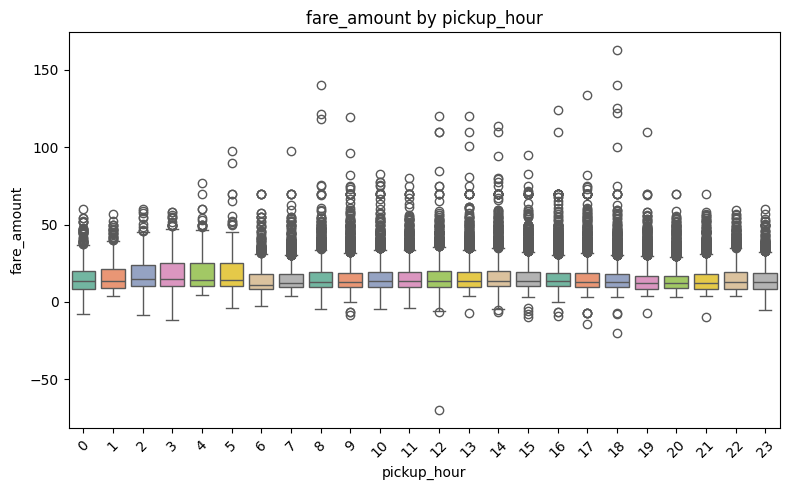

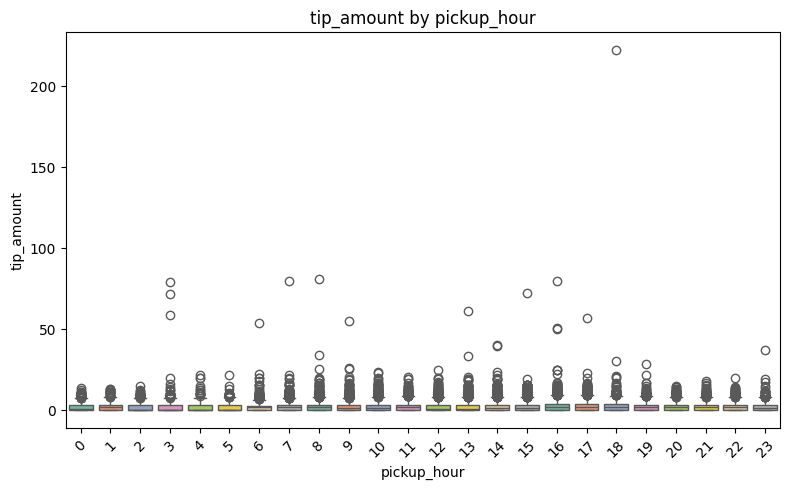

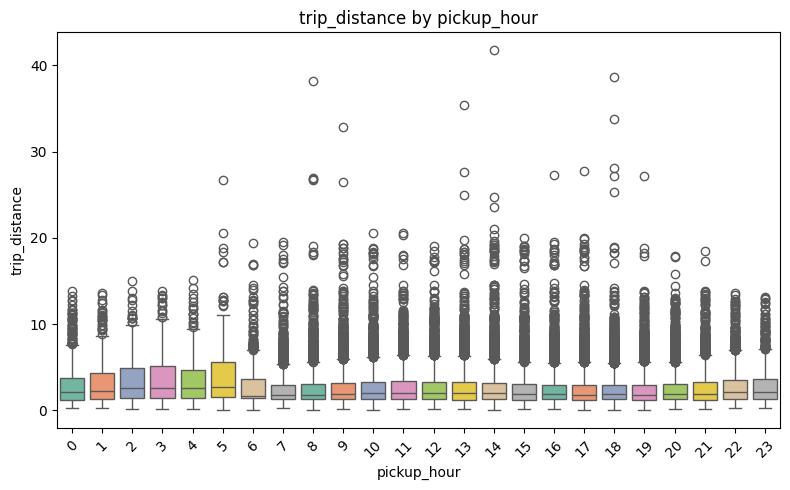

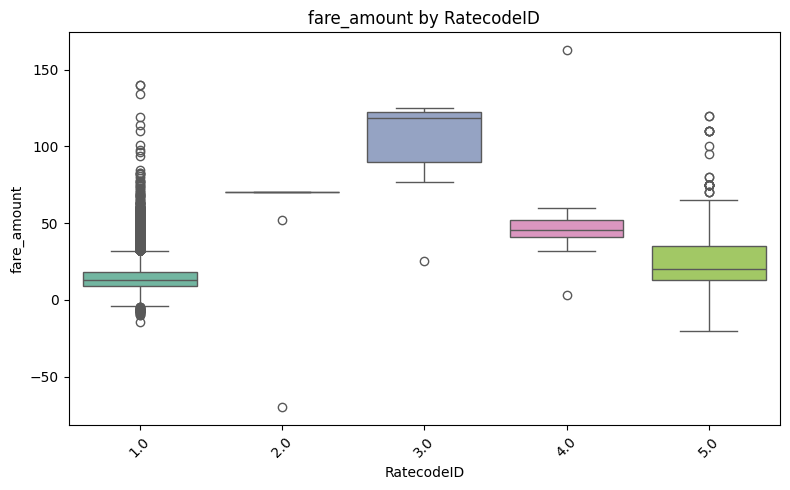

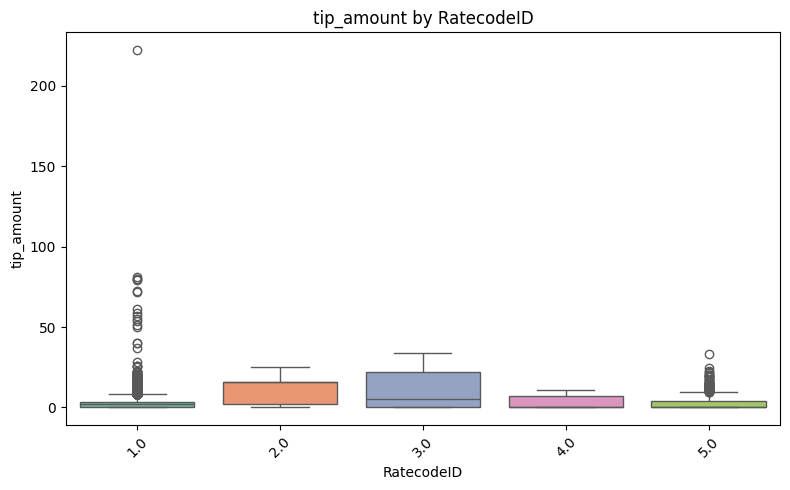

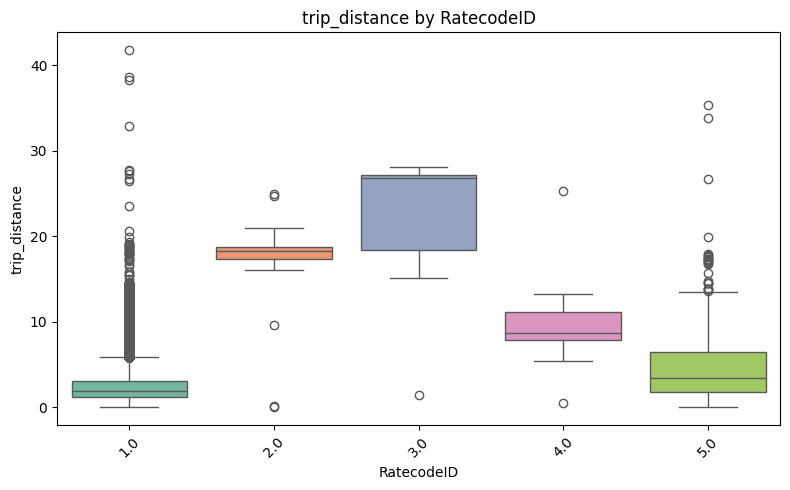

In [12]:
# Boxplots Categorical vs Numerical

for cat in ['payment_type', 'pickup_hour', 'RatecodeID']:
    for num in ['fare_amount', 'tip_amount', 'trip_distance']:
        plt.figure(figsize=(8, 5))
        sns.boxplot(x=cat, y=num, data=nyc_clean, palette = 'Set2', hue=cat, dodge=False, legend=False)
        plt.title(f"{num} by {cat}")
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

#### Crosstabs

In [13]:
# payment_type vs is_weekend_pickup
pd.crosstab(nyc_clean['payment_type'], nyc_clean['is_weekend_pickup'], normalize='index') * 100

is_weekend_pickup,0,1
payment_type,,
1.0,75.426271,24.573729
2.0,75.525511,24.474489
3.0,78.527607,21.472393
4.0,72.000000,28.000000


In [14]:
# payment_type vs is_weekend_dropoff
pd.crosstab(nyc_clean['payment_type'], nyc_clean['is_weekend_dropoff'], normalize='index') * 100

is_weekend_dropoff,0,1
payment_type,,
1.0,75.404653,24.595347
2.0,75.486036,24.513964
3.0,78.527607,21.472393
4.0,72.000000,28.000000


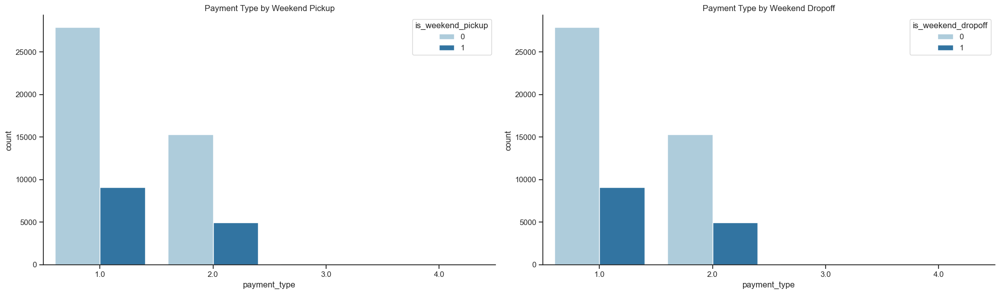

In [15]:
# Set the plotting style
custom_params = {'axes.spines.right': False, 'axes.spines.top': False}
sns.set_theme(style="ticks", palette="Paired", rc=custom_params)

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(20, 6))

sns.countplot(data=nyc_clean, x='payment_type', hue='is_weekend_pickup', palette = 'Paired', ax=axs[0])
axs[0].set_title("Payment Type by Weekend Pickup")

sns.countplot(data=nyc_clean, x='payment_type', hue='is_weekend_dropoff', palette = 'Paired', ax=axs[1])
axs[1].set_title("Payment Type by Weekend Dropoff")

plt.tight_layout()
plt.show()

In [16]:
# pickup_hour vs is_weekend_pickup
pd.crosstab(nyc_clean['pickup_hour'], nyc_clean['is_weekend_pickup'], normalize='index') * 100

is_weekend_pickup,0,1
pickup_hour,,
0,52.731327,47.268673
1,43.266476,56.733524
2,38.223140,61.776860
3,41.162228,58.837772
4,38.461538,61.538462
5,68.092105,31.907895
6,89.125000,10.875000
7,91.175126,8.824874
8,89.075630,10.924370


In [17]:
# dropoff_hour vs is_weekend_dropoff
pd.crosstab(nyc_clean['dropoff_hour'], nyc_clean['is_weekend_dropoff'], normalize='index') * 100

is_weekend_dropoff,0,1
dropoff_hour,,
0,54.276663,45.723337
1,45.238095,54.761905
2,38.372093,61.627907
3,38.160920,61.839080
4,42.424242,57.575758
5,59.106529,40.893471
6,85.333333,14.666667
7,91.324435,8.675565
8,89.778130,10.221870


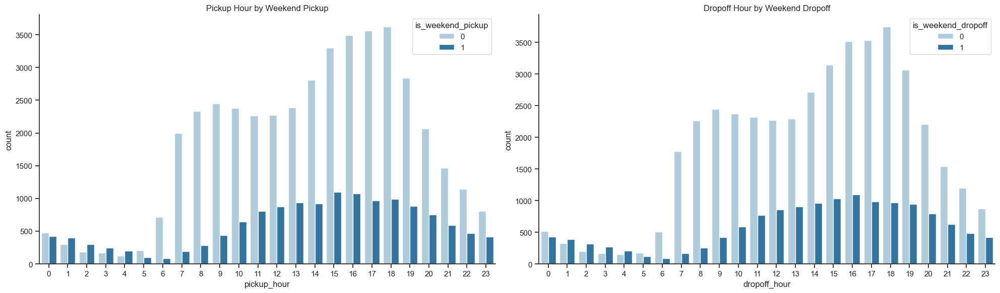

In [18]:
# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(20, 6))

sns.countplot(data=nyc_clean, x='pickup_hour', hue='is_weekend_pickup', palette = 'Paired', ax=axs[0])
axs[0].set_title("Pickup Hour by Weekend Pickup")

sns.countplot(data=nyc_clean, x='dropoff_hour', hue='is_weekend_dropoff', palette = 'Paired', ax=axs[1])
axs[1].set_title("Dropoff Hour by Weekend Dropoff")

plt.tight_layout()
plt.show()

In [19]:
# pickup_hour vs trip_type
pd.crosstab(nyc_clean['pickup_hour'], nyc_clean['trip_type'], normalize='index') * 100

trip_type,1.0,2.0
pickup_hour,,
0,96.432553,3.567447
1,97.851003,2.148997
2,95.867769,4.132231
3,94.430993,5.569007
4,95.076923,4.923077
5,96.710526,3.289474
6,99.000000,1.000000
7,99.542753,0.457247
8,99.083270,0.916730


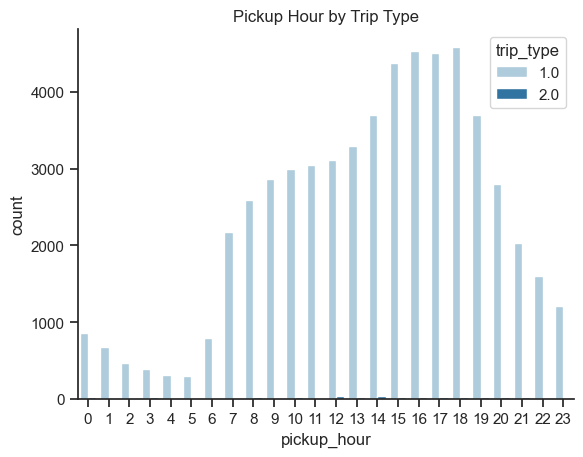

In [20]:
sns.countplot(data=nyc_clean, x='pickup_hour', hue='trip_type', palette = 'Paired')
plt.title("Pickup Hour by Trip Type")
plt.show()

In [21]:
# pickup_dayofweek vs payment_type
pd.crosstab(nyc_clean['pickup_dayofweek'], nyc_clean['payment_type'], normalize = 'index') * 100

payment_type,1.0,2.0,3.0,4.0
pickup_dayofweek,,,,
Friday,63.868743,35.929140,0.178338,0.023778
Monday,64.190950,35.418147,0.390903,0.000000
Saturday,62.836800,36.883987,0.237331,0.041882
Sunday,66.248377,33.434300,0.259628,0.057695
Thursday,65.244682,34.301988,0.371963,0.081367
Tuesday,64.328468,35.388008,0.241521,0.042004
Wednesday,64.190317,35.451944,0.298116,0.059623


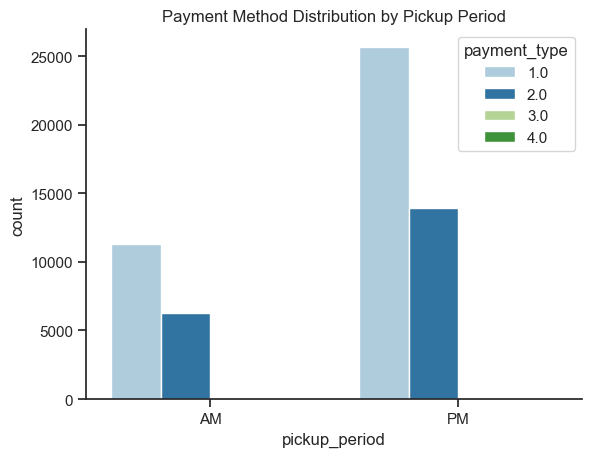

In [22]:
sns.countplot(data = nyc_clean, x = 'pickup_period', hue = 'payment_type', palette = 'Paired')
plt.title("Payment Method Distribution by Pickup Period")
plt.show()

In [23]:
# pickup_month vs paymeny_type
pd.crosstab(nyc_clean['pickup_month'], nyc_clean['payment_type'], normalize = 'index') * 100

payment_type,1.0,2.0,3.0,4.0
pickup_month,,,,
1,64.403682,35.269139,0.283671,0.043508


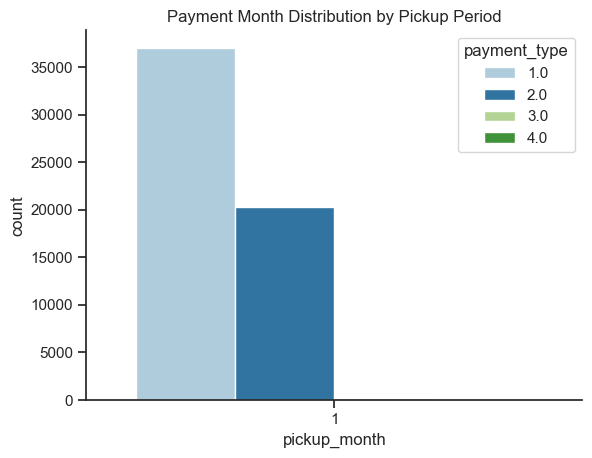

In [24]:
sns.countplot(data = nyc_clean, x = 'pickup_month', hue = 'payment_type', palette = 'Paired')
plt.title("Payment Month Distribution by Pickup Period")
plt.show()

### Scatterplots

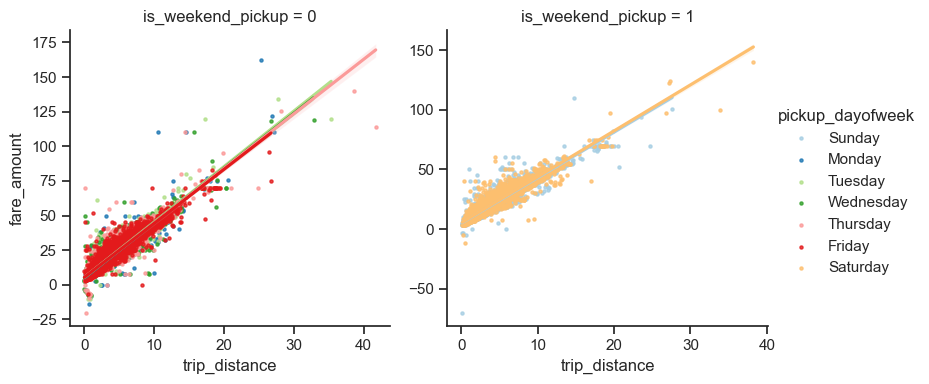

In [25]:
# Trip Distance vs Fare Amount
sns.lmplot(
    data = nyc_clean, 
    x = 'trip_distance', y = 'fare_amount', 
    hue = 'pickup_dayofweek', col = 'is_weekend_pickup', 
    palette = 'Paired', height = 4, 
    scatter_kws = {'s': 5}, 
    facet_kws = dict(sharex = False, sharey = False)
    )

plt.show()

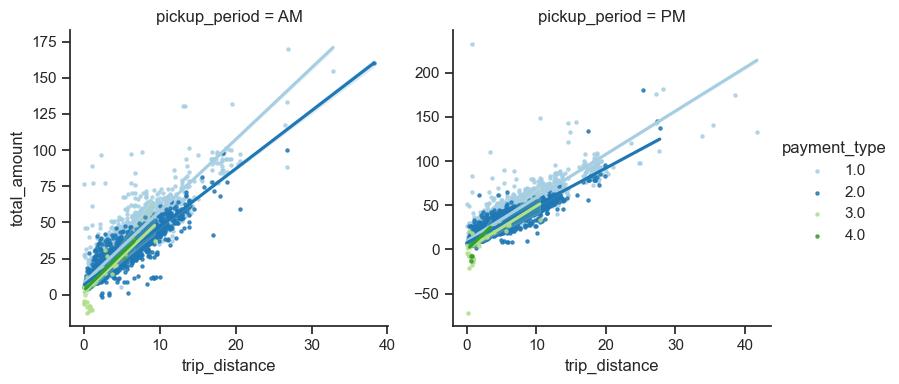

In [26]:
# Trip Distance vs Total Amount
sns.lmplot(
    data = nyc_clean, 
    x = 'trip_distance', y = 'total_amount', 
    hue = 'payment_type', col = 'pickup_period',
    palette = 'Paired', height = 4, 
    scatter_kws = {'s': 5},
    facet_kws = dict(sharex = False, sharey = False)
    )

plt.show()

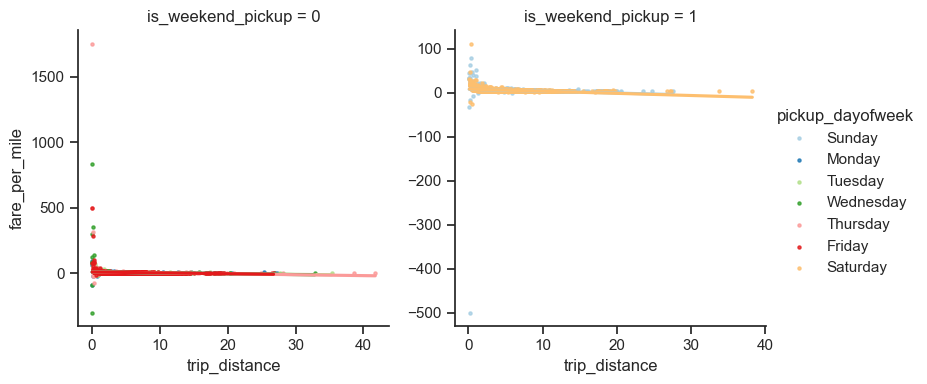

In [27]:
sns.lmplot(
    data = nyc_clean, 
    x = 'trip_distance', y = 'fare_per_mile', 
    hue = 'pickup_dayofweek', col = 'is_weekend_pickup',
    palette = 'Paired', height = 4, 
    scatter_kws = {'s': 5},
    facet_kws = dict(sharex = False, sharey = False)
    )

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

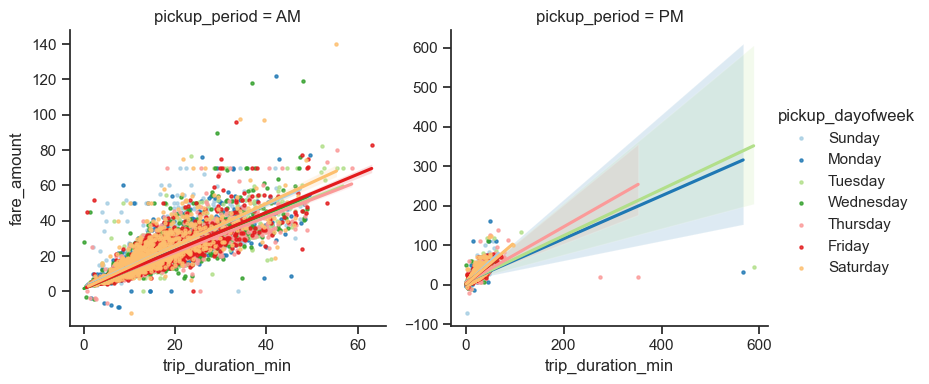

In [28]:
sns.lmplot(
    data = nyc_clean, 
    x = 'trip_duration_min', y = 'fare_amount', 
    hue = 'pickup_dayofweek', col = 'pickup_period',
    palette = 'Paired', height = 4, 
    scatter_kws = {'s': 5},
    facet_kws = dict(sharex = False, sharey = False)
    )

plt.show

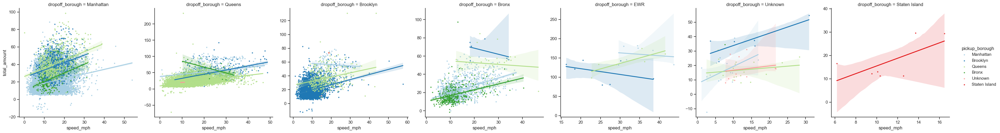

In [29]:
sns.lmplot(
    data = nyc_clean, 
    x = 'speed_mph', y = 'total_amount', 
    hue = 'pickup_borough', col = 'dropoff_borough',
    palette = 'Paired', height = 5, 
    scatter_kws = {'s': 5},
    facet_kws = dict(sharex = False, sharey = False)
    )

plt.show()

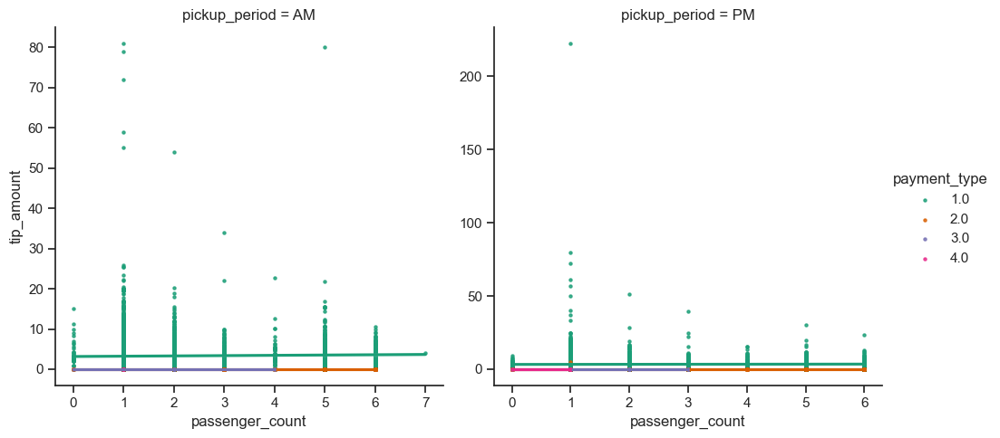

In [30]:
sns.lmplot(
    data = nyc_clean, 
    x = 'passenger_count', y = 'tip_amount', 
    hue = 'payment_type', col = 'pickup_period',
    palette = 'Dark2', height = 5, 
    scatter_kws = {'s': 5},
    facet_kws = dict(sharex = False, sharey = False)
    )

plt.show()

## **Research Questions**

### 1. **Trip Patterns and Demand Analysis**

#### When are NYC taxis most in demand? (Analyze peak hours, days, or seasons.)

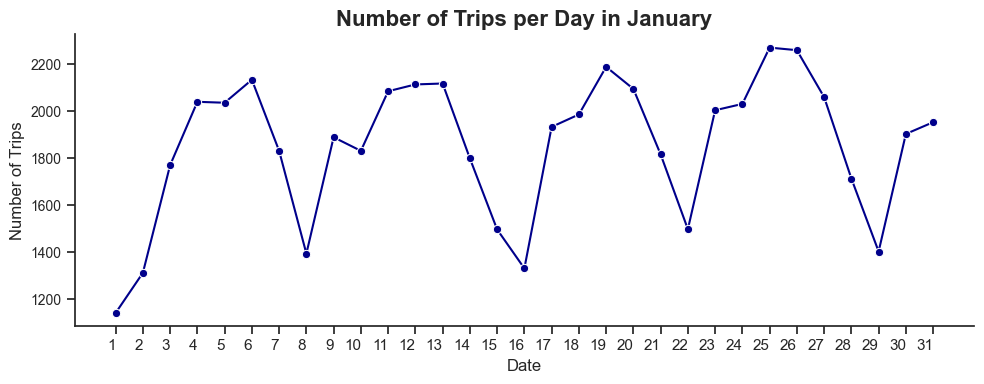

In [31]:
# Count trips per day
nyc_clean['lpep_pickup_datetime'] = pd.to_datetime(nyc_clean['lpep_pickup_datetime'], errors='coerce')
nyc_clean['lpep_dropoff_datetime'] = pd.to_datetime(nyc_clean['lpep_dropoff_datetime'], errors='coerce')

nyc_clean['pickup_day'] = nyc_clean['lpep_pickup_datetime'].dt.day
grouped_date = nyc_clean.groupby('pickup_day').size().reset_index(name = 'Trip Count')

# Plot
plt.figure(figsize=(10, 4))
sns.lineplot(data=grouped_date, x='pickup_day', y='Trip Count', 
             color='darkblue', linewidth=1.5, marker='o')
plt.xticks(ticks=grouped_date['pickup_day'], ha='right')
plt.yticks(fontsize=10)
plt.title('Number of Trips per Day in January', fontsize= 16, fontweight='bold')
plt.xlabel('Date')
plt.ylabel('Number of Trips')
# plt.xticks(rotation=45, ha='right')
# plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

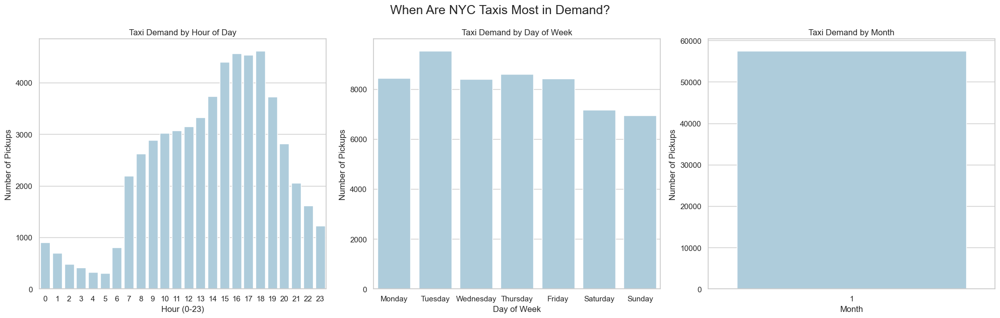

In [32]:
# Set the plotting style
sns.set_theme(style="whitegrid", palette="Paired")

# Create subplots
fig, axs = plt.subplots(1, 3, figsize=(20, 6))

# Plot 1: Pickup Hour
sns.countplot(data = nyc_clean, x='pickup_hour', ax=axs[0])
axs[0].set_title("Taxi Demand by Hour of Day")
axs[0].set_xlabel("Hour (0-23)")
axs[0].set_ylabel("Number of Pickups")

# Plot 2: Pickup Day of Week
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
sns.countplot(data=nyc_clean, x='pickup_dayofweek', order=day_order, ax=axs[1])
axs[1].set_title("Taxi Demand by Day of Week")
axs[1].set_xlabel("Day of Week")
axs[1].set_ylabel("Number of Pickups")

# Plot 3: Pickup Month
month_order = [1]  # Adjust based on your data range
sns.countplot(data=nyc_clean, x='pickup_month', order=month_order, ax=axs[2])
axs[2].set_title("Taxi Demand by Month")
axs[2].set_xlabel("Month")
axs[2].set_ylabel("Number of Pickups")

# Layout
plt.tight_layout()
plt.suptitle("When Are NYC Taxis Most in Demand?", fontsize=18, y=1.05)
plt.show()

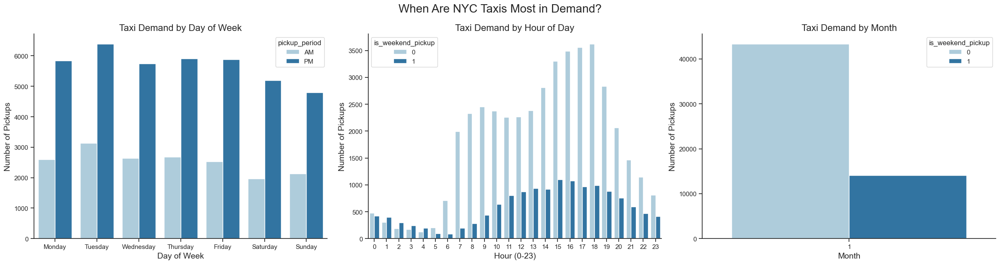

In [33]:
# Set the plotting style
custom_params = {'axes.spines.right': False, 'axes.spines.top': False}
sns.set_theme(style="ticks", palette="Paired", rc=custom_params)

# Create subplots
fig, axs = plt.subplots(1, 3, figsize = (24, 6))

# Plot 2: Pickup Day of Week
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
sns.countplot(data=nyc_clean, x='pickup_dayofweek', hue = 'pickup_period', order=day_order, ax=axs[0])
axs[0].set_title("Taxi Demand by Day of Week", fontsize = 16)
axs[0].set_xlabel("Day of Week", fontsize = 14)
axs[0].set_ylabel("Number of Pickups", fontsize = 14)

# Plot 1: Pickup Hour
sns.countplot(data = nyc_clean, x='pickup_hour', hue='is_weekend_pickup', ax=axs[1])
axs[1].set_title("Taxi Demand by Hour of Day", fontsize = 16)
axs[1].set_xlabel("Hour (0-23)", fontsize = 14)
axs[1].set_ylabel("Number of Pickups", fontsize = 14)

# Plot 3: Pickup Month
month_order = [1]  # Adjust based on your data range
sns.countplot(data=nyc_clean, x='pickup_month', hue='is_weekend_pickup', order=month_order, ax=axs[2])
axs[2].set_title("Taxi Demand by Month", fontsize = 16)
axs[2].set_xlabel("Month", fontsize = 14)
axs[2].set_ylabel("Number of Pickups", fontsize = 14)

# Layout
plt.tight_layout()
plt.suptitle("When Are NYC Taxis Most in Demand?", fontsize = 20, y=1.05)
plt.show()

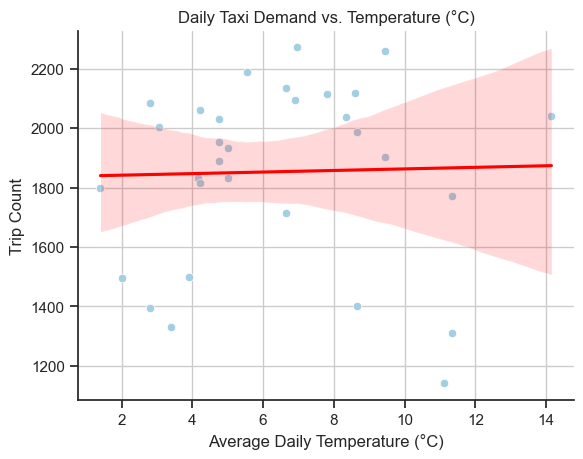

In [34]:
daily_demand = nyc_clean.groupby('pickup_date').agg({
    'avg_temp': 'mean',
    'VendorID': 'count'  # assuming each row = one trip
}).rename(columns={'VendorID': 'trip_count'})

sns.scatterplot(data=daily_demand, x='avg_temp', y='trip_count')
sns.regplot(data=daily_demand, x='avg_temp', y='trip_count', scatter=False, color='red')
plt.title("Daily Taxi Demand vs. Temperature (°C)")
plt.xlabel("Average Daily Temperature (°C)")
plt.ylabel("Trip Count")
plt.grid(True)
plt.show()

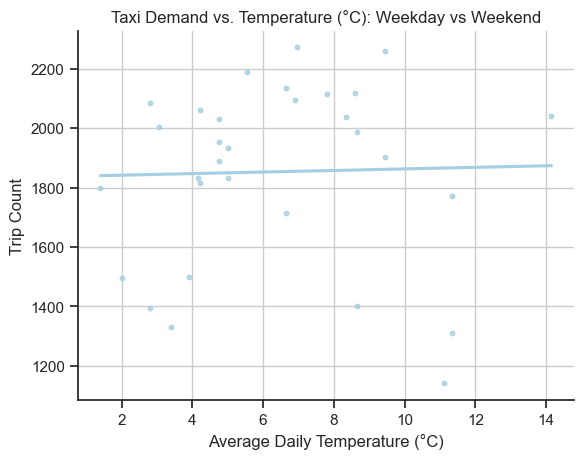

In [35]:
# Group by pickup_date and is_weekend_pickup, calculate trip count and average temperature
daily_demand = nyc_clean.groupby(['pickup_date', 'is_weekend_pickup']).agg(
    avg_temp=('avg_temp', 'mean'),
    trip_count=('VendorID', 'count')  # Or any non-null column to count trips
).reset_index()

# Convert boolean to readable labels
daily_demand['is_weekend_pickup'] = daily_demand['is_weekend_pickup'].map({True: 'Weekend', False: 'Weekday'})

# Plot
sns.scatterplot(data=daily_demand, x='avg_temp', y='trip_count', hue='is_weekend_pickup', palette='Set2')
sns.regplot(data=daily_demand, x='avg_temp', y='trip_count', scatter_kws={'s': 10}, ci=None, ax=plt.gca())
plt.xlabel("Average Daily Temperature (°C)")
plt.ylabel("Trip Count")
plt.title("Taxi Demand vs. Temperature (°C): Weekday vs Weekend")
plt.grid(True)
plt.show()


#### Which locations have the highest number of pickups and drop-offs? (Identify taxi hotspots.)

In [36]:
# Lokasi penjemputan paling populer
grouped_pickup_zone = nyc_clean.groupby(['pickup_borough', "pickup_zone"]).size().reset_index(name="Trip Count").rename(columns = {'pickup_borough': 'Pickup Borough', 'pickup_zone': 'Pickup Zone'})

# Diurutkan berdasarkan jumlah perjalanan
grouped_pickup_zone = grouped_pickup_zone.sort_values("Trip Count", ascending=False)

# Diambil berdasarkan 10 jumlah perjalanan terbanyak
top_10_puzones = grouped_pickup_zone.head(10)
top_10_puzones

,Pickup Borough,Pickup Zone,Trip Count
100,Manhattan,East Harlem North,12394
101,Manhattan,East Harlem South,8334
133,Queens,Forest Hills,3484
97,Manhattan,Central Harlem,3411
110,Manhattan,Morningside Heights,3354
99,Manhattan,Central Park,2775
129,Queens,Elmhurst,2676
70,Brooklyn,Fort Greene,2033
118,Queens,Astoria,1515
115,Manhattan,Washington Heights South,1493


In [37]:
grouped_dropoff_zone = nyc_clean.groupby(['dropoff_borough', "dropoff_zone"]).size().reset_index(name="Trip Count").rename(columns = {'dropoff_borough': 'Dropoff Borough', 'dropoff_zone': 'Dropoff Zone'})

grouped_dropoff_zone = grouped_dropoff_zone.sort_values("Trip Count", ascending=False)

top_10_dozones = grouped_dropoff_zone.head(10)
top_10_dozones

,Dropoff Borough,Dropoff Zone,Trip Count
115,Manhattan,East Harlem South,3040
114,Manhattan,East Harlem North,2948
158,Manhattan,Upper East Side North,2619
107,Manhattan,Central Harlem,2249
160,Manhattan,Upper West Side North,2208
108,Manhattan,Central Harlem North,2017
144,Manhattan,Morningside Heights,1945
168,Manhattan,Yorkville West,1473
161,Manhattan,Upper West Side South,1381
136,Manhattan,Manhattan Valley,1381


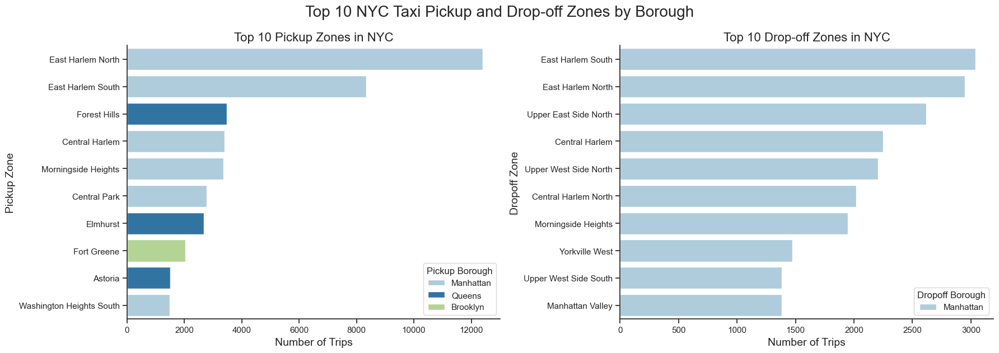

In [38]:
custom_params = {'axes.spines.right': False, 'axes.spines.top': False}
sns.set_theme(style="ticks", palette="Paired", rc=custom_params)

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Plot Top 10 Pickup Zones
sns.barplot(
    data=top_10_puzones,
    y="Pickup Zone",
    x="Trip Count",
    hue="Pickup Borough",
    dodge=False,
    ax=axes[0]
)
axes[0].set_title("Top 10 Pickup Zones in NYC", fontsize = 16)
axes[0].set_xlabel("Number of Trips", fontsize = 14)
axes[0].set_ylabel("Pickup Zone", fontsize = 14)

# Plot Top 10 Drop-off Zones
sns.barplot(
    data=top_10_dozones,
    y="Dropoff Zone",
    x="Trip Count",
    hue="Dropoff Borough",
    dodge=False,
    ax=axes[1]
)
axes[1].set_title("Top 10 Drop-off Zones in NYC", fontsize = 16)
axes[1].set_xlabel("Number of Trips", fontsize = 14)
axes[1].set_ylabel("Dropoff Zone", fontsize = 14)

# Adjust layout
plt.tight_layout()
plt.suptitle('Top 10 NYC Taxi Pickup and Drop-off Zones by Borough', fontsize = 20, y=1.05)
plt.show()

In [39]:
import folium
import pandas as pd

# Create a map centered around NYC (or wherever your zones are located)
map_center = [nyc_clean['pickup_latitude'].mean(), nyc_clean['pickup_longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=10)

# Create heatmap for pickup locations
from folium.plugins import HeatMap

pickup_data = nyc_clean[['pickup_latitude', 'pickup_longitude']].dropna()
pickup_heat = HeatMap(pickup_data.values, radius=10, max_zoom=13)
m.add_child(pickup_heat)

# Create heatmap for dropoff locations
dropoff_data = nyc_clean[['dropoff_latitude', 'dropoff_longitude']].dropna()
dropoff_heat = HeatMap(dropoff_data.values, radius=10, max_zoom=13)
m.add_child(dropoff_heat)

# Display map directly in the notebook
m

# Save map as HTML
# m.save("taxi_pickup_dropoff_heatmap.html")

In [40]:
zone = gpd.read_file('C:/Users/Dell/Documents/Purwadhika/Module 2 - Data Analysis/CAPSTONE MODULE 2/taxi_zones/taxi_zones.shp')

In [41]:
# Group by PULocationID (pickup) and DOLocationID (dropoff) to get the amount of pickups and dropoffs per zone
pu_zone = nyc_clean.groupby(['PULocationID'], as_index=False).size()
do_zone = nyc_clean.groupby(['DOLocationID'], as_index=False).size()

In [42]:
# Merge with the shapefile data (zone boundaries)
pu_zone = gpd.GeoDataFrame(pd.merge(pu_zone, zone, left_on='PULocationID', right_on='LocationID')).drop('LocationID', axis=1)
do_zone = gpd.GeoDataFrame(pd.merge(do_zone, zone, left_on='DOLocationID', right_on='LocationID')).drop('LocationID', axis=1)

In [43]:
# Reproject the GeoDataFrames to EPSG:3857 (Web Mercator) for compatibility with the basemap
pu_zone = pu_zone.to_crs(epsg=3857)
do_zone = do_zone.to_crs(epsg=3857)

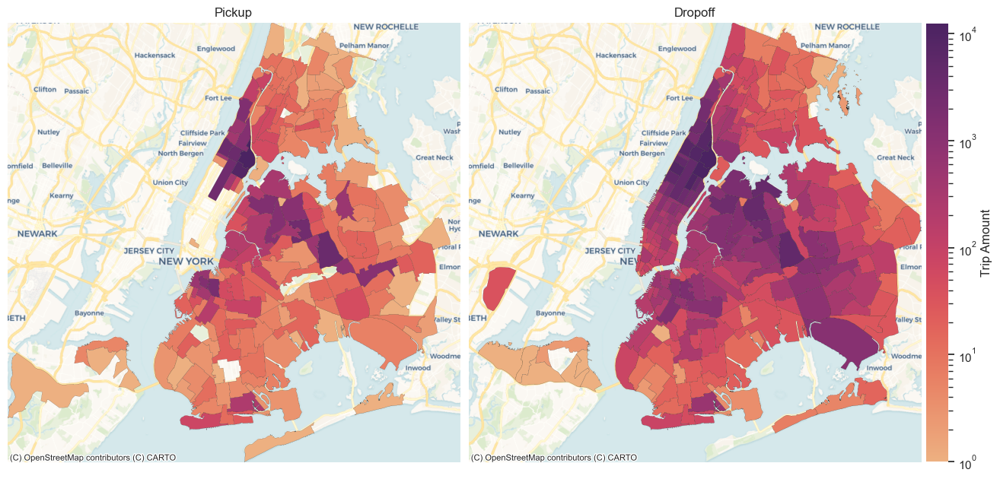

In [44]:
# Create the figure with two subplots
fig, axs = plt.subplots(ncols=2, figsize=(20, 10))
fig.subplots_adjust(bottom=0.1, top=0.9, left=0.09, right=0.8, wspace=0.02, hspace=0.02)

# Plot the pickup data
vmin, vmax = pu_zone['size'].min(), pu_zone['size'].max()
axs[0] = pu_zone.plot(column='size', linewidth=0.09, edgecolor='k', figsize=(10, 10), 
                      norm=colors.LogNorm(vmin=vmin, vmax=vmax), cmap='flare', legend=False, ax=axs[0]) 

ctx.add_basemap(axs[0], source=ctx.providers.CartoDB.Voyager, crs=pu_zone.crs.to_string())
axs[0].set_title('Pickup')
axs[0].set_axis_off()

# Plot the dropoff data
vmin, vmax = do_zone['size'].min(), do_zone['size'].max()
axs[1] = do_zone.plot(column='size', linewidth=0.1, edgecolor='k', figsize=(10, 10), 
                      norm=colors.LogNorm(vmin=vmin, vmax=vmax), cmap='flare', legend=False, ax=axs[1])

ctx.add_basemap(axs[1], source=ctx.providers.CartoDB.Voyager, crs=do_zone.crs.to_string())
axs[1].set_title('Dropoff')
axs[1].set_axis_off()

# Get the bounding box (extent) of the pickup and dropoff zones
pickup_bounds = pu_zone.bounds
dropoff_bounds = do_zone.bounds

# Find the maximum and minimum values of longitude and latitude for consistent zoom level
minx = min(pickup_bounds.minx.min(), dropoff_bounds.minx.min())
maxx = max(pickup_bounds.maxx.max(), dropoff_bounds.maxx.max())
miny = min(pickup_bounds.miny.min(), dropoff_bounds.miny.min())
maxy = max(pickup_bounds.maxy.max(), dropoff_bounds.maxy.max())

# Set the same extent (zoom level) for both subplots
for ax in axs:
    ax.set_xlim(minx, maxx)
    ax.set_ylim(miny, maxy)

# Add the color bar
patch_col = axs[0].collections[0]
cb = fig.colorbar(patch_col, ax=axs, shrink=0.72, orientation="vertical", pad=0.005)
cb.ax.set_ylabel('Trip Amount')

# Remove the border of the color bar
cb.outline.set_visible(False)

# Display the plot
plt.show()

#### How do trip distance vary by borough or zone? (Compare Manhattan vs Brooklyn, etc.)

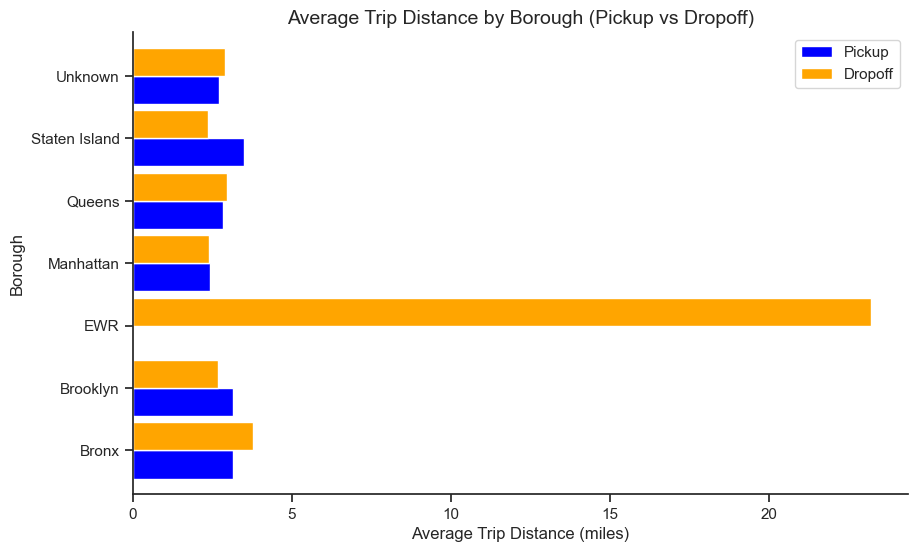

In [45]:
# Group by pickup borough and calculate the average trip distance
pickup_borough_distance = nyc_clean.groupby('pickup_borough')['trip_distance'].mean()

# Group by dropoff borough and calculate the average trip distance
dropoff_borough_distance = nyc_clean.groupby('dropoff_borough')['trip_distance'].mean()

# Combine both pickup and dropoff borough distance comparisons into a single DataFrame for comparison
borough_distance_comparison = pd.DataFrame({
    'pickup_borough_avg': pickup_borough_distance,
    'dropoff_borough_avg': dropoff_borough_distance
}).fillna(0)  # Fill any missing values with 0

# Plot the results for comparison
fig, ax = plt.subplots(figsize=(10, 6))
borough_distance_comparison.plot(kind='barh', ax=ax, color=['blue', 'orange'], width=0.9)

ax.set_title('Average Trip Distance by Borough (Pickup vs Dropoff)', fontsize=14)
ax.set_xlabel('Average Trip Distance (miles)', fontsize=12)
ax.set_ylabel('Borough', fontsize=12)
ax.legend(['Pickup', 'Dropoff'])
plt.show()

#### Do longer trips occur more frequently at PM?

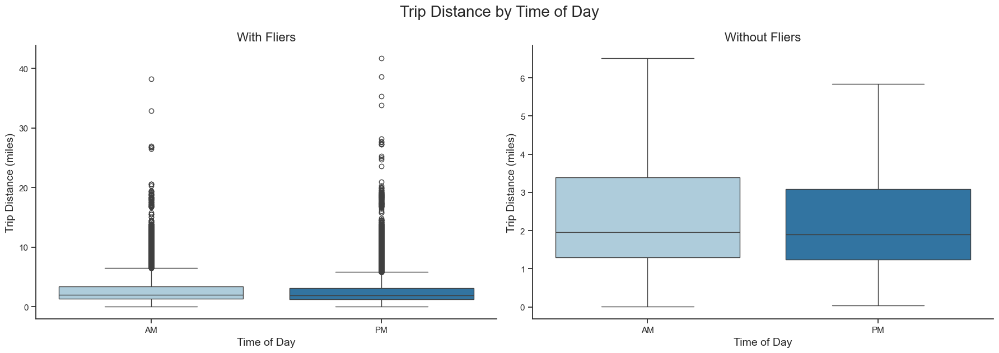

In [46]:
# Boxplot comparing trip distance by time of day
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

sns.boxplot(data = nyc_clean, x = 'pickup_period', y = 'trip_distance', 
            palette = 'Paired', dodge=False, ax=axes[0]) 
axes[0].set_title('With Fliers', fontsize = 16)
axes[0].set_xlabel('Time of Day', fontsize = 14)
axes[0].set_ylabel('Trip Distance (miles)', fontsize = 14)

sns.boxplot(data = nyc_clean, x = 'pickup_period', y = 'trip_distance', 
            palette = 'Paired', dodge=False, showfliers = False, ax=axes[1]) 
axes[1].set_title('Without Fliers', fontsize = 16)
axes[1].set_xlabel('Time of Day', fontsize = 14)
axes[1].set_ylabel('Trip Distance (miles)', fontsize = 14)

plt.tight_layout()
plt.suptitle('Trip Distance by Time of Day', fontsize = 20, y=1.05)
plt.show()

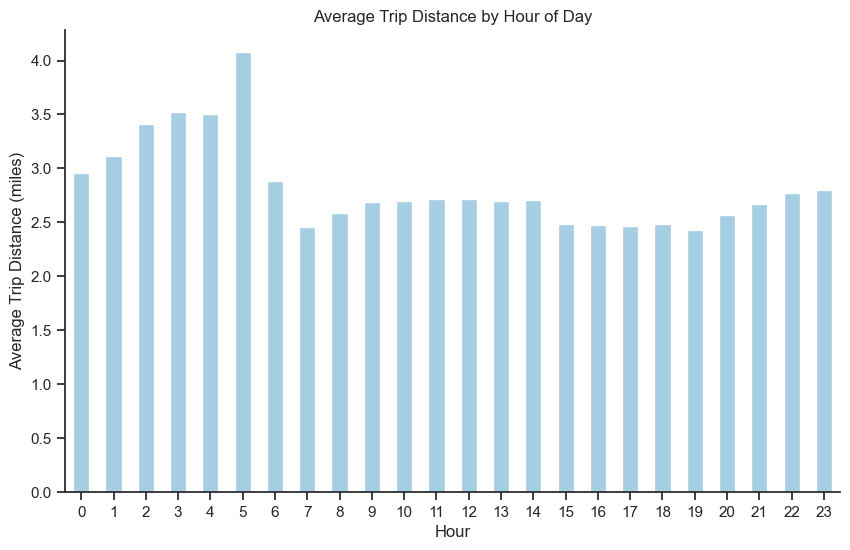

In [47]:
hourly_distance = nyc_clean.groupby('pickup_hour')['trip_distance'].mean()

plt.figure(figsize=(10, 6))
hourly_distance.plot(kind='bar')
plt.title('Average Trip Distance by Hour of Day')
plt.xlabel('Hour')
plt.ylabel('Average Trip Distance (miles)')
plt.xticks(rotation=0)
plt.show()

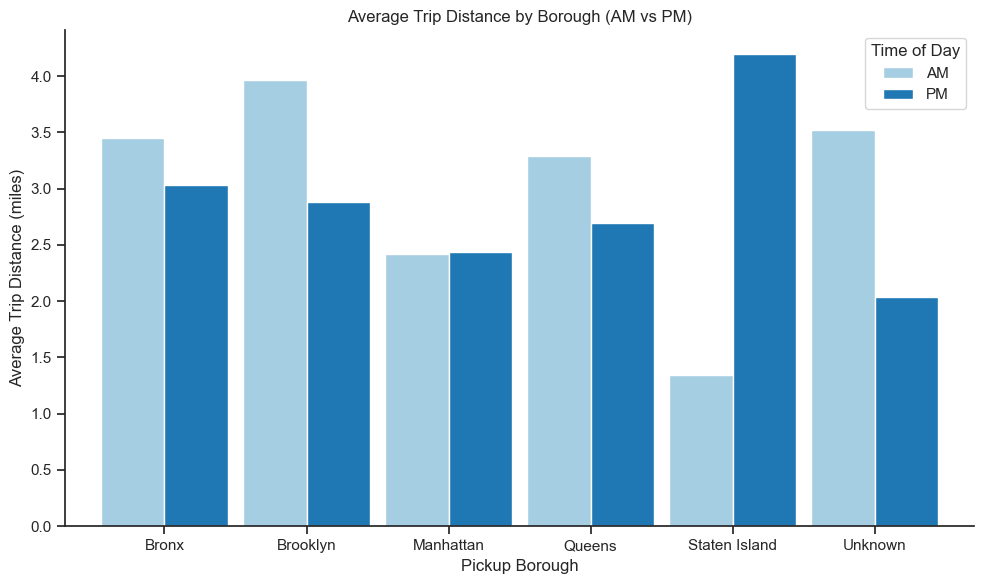

In [48]:
# Group by pickup_borough and time of day, then compute mean distance
borough_time = nyc_clean.groupby(['pickup_borough', 'pickup_period'])['trip_distance'].mean().unstack()

# Plotting
borough_time.plot(kind='bar', figsize=(10, 6), width = 0.9)
plt.title('Average Trip Distance by Borough (AM vs PM)')
plt.ylabel('Average Trip Distance (miles)')
plt.xlabel('Pickup Borough')
plt.xticks(rotation=0)
plt.legend(title='Time of Day')
plt.tight_layout()
plt.show()

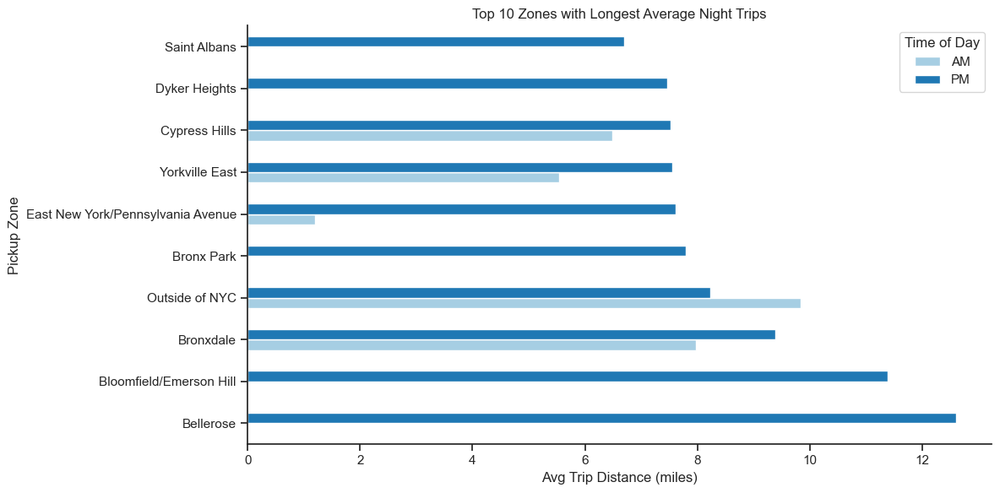

In [49]:
zone_time = nyc_clean.groupby(['pickup_zone', 'pickup_period'])['trip_distance'].mean().unstack()

# You might want to display top 10 zones by average distance at night
top_zones = zone_time.sort_values('PM', ascending=False).head(10)

# Plot
top_zones.plot(kind='barh', figsize=(12, 6))
plt.title('Top 10 Zones with Longest Average Night Trips')
plt.ylabel('Pickup Zone')
plt.xlabel('Avg Trip Distance (miles)')
plt.xticks(rotation=0)
plt.legend(title='Time of Day')
plt.tight_layout()
plt.show()

### 2. **Pricing and Fare Analysis**

#### What factors influence total fare the most? (Trip distance, location, congestion surcharge, etc.)

In [50]:
categorical_cols = ['VendorID', 'store_and_fwd_flag', 'is_weekend_pickup', 'is_weekend_dropoff', 'pickup_hour',
                    'pickup_period', 'pickup_dayofweek', 'pickup_month', 'dropoff_hour', 'dropoff_period',
                    'dropoff_dayofweek', 'dropoff_month', 'RatecodeID', 'payment_type', 'trip_type', 
                    'pickup_borough', 'pickup_zone', 'dropoff_borough', 'dropoff_zone']
numerical_cols = ['passenger_count', 'trip_distance', 'trip_duration_min', 'tip_amount', 'fare_amount', 'total_amount',
                  'extra', 'mta_tax', 'tolls_amount', 'improvement_surcharge', 'congestion_surcharge', 'speed_mph', 
                  'fare_per_mile']

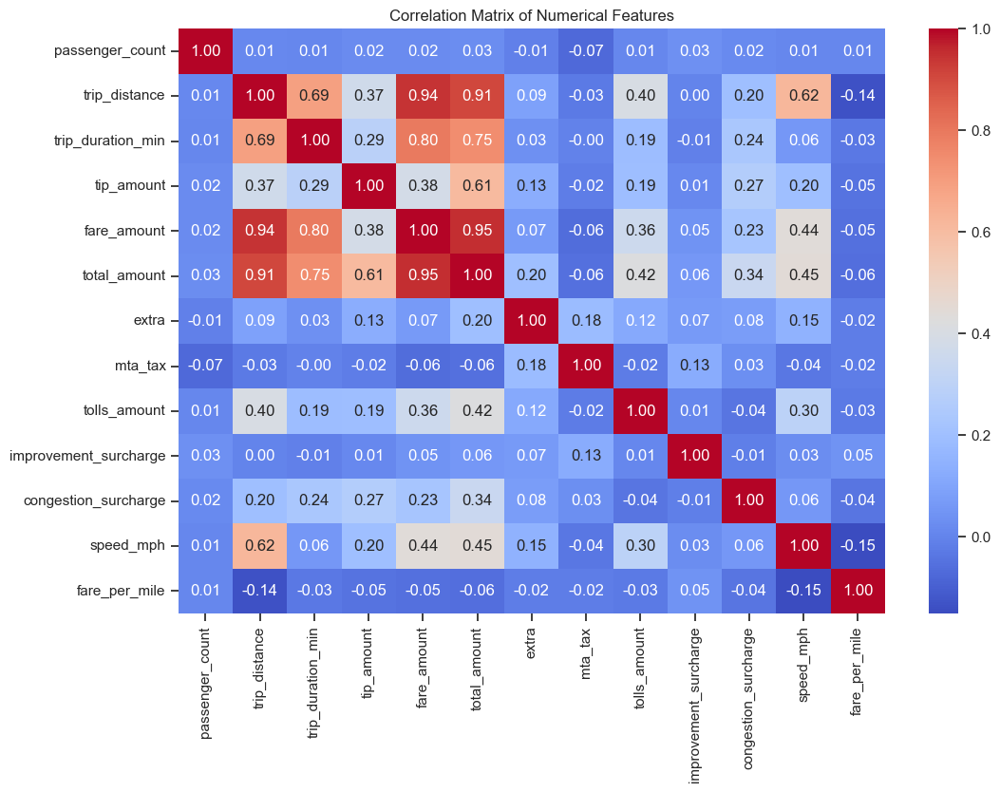

In [51]:
plt.figure(figsize=(12, 8))
sns.heatmap(nyc_clean[numerical_cols].corr(), annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Correlation Matrix of Numerical Features")
plt.show()

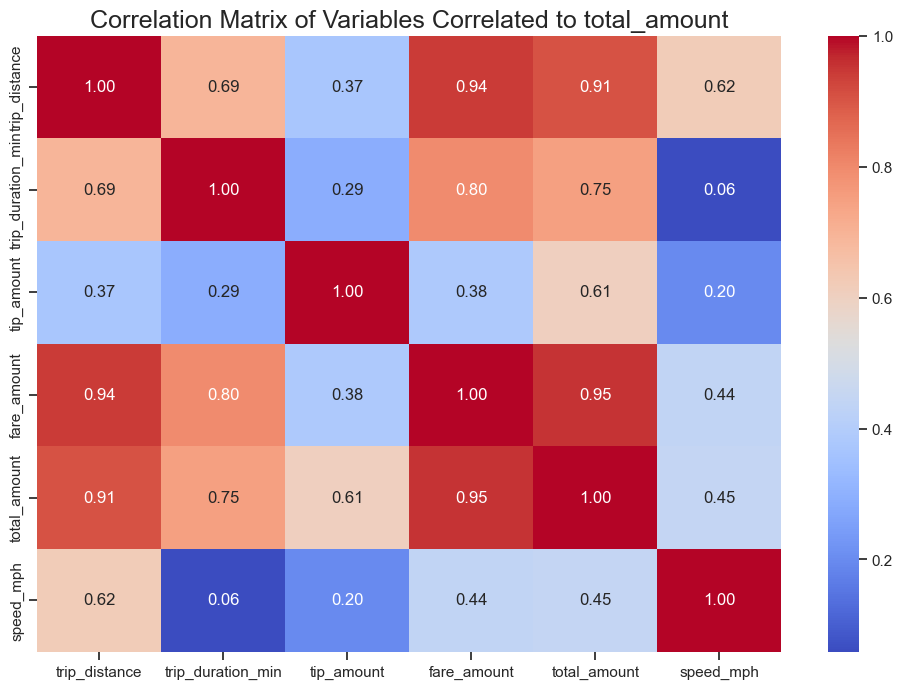

In [52]:
high_corr = ['trip_distance', 'trip_duration_min', 'tip_amount', 'fare_amount', 'total_amount', 'speed_mph']

plt.figure(figsize=(12, 8))
sns.heatmap(nyc_clean[high_corr].corr(), annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Correlation Matrix of Variables Correlated to total_amount", fontsize=18)
plt.show()

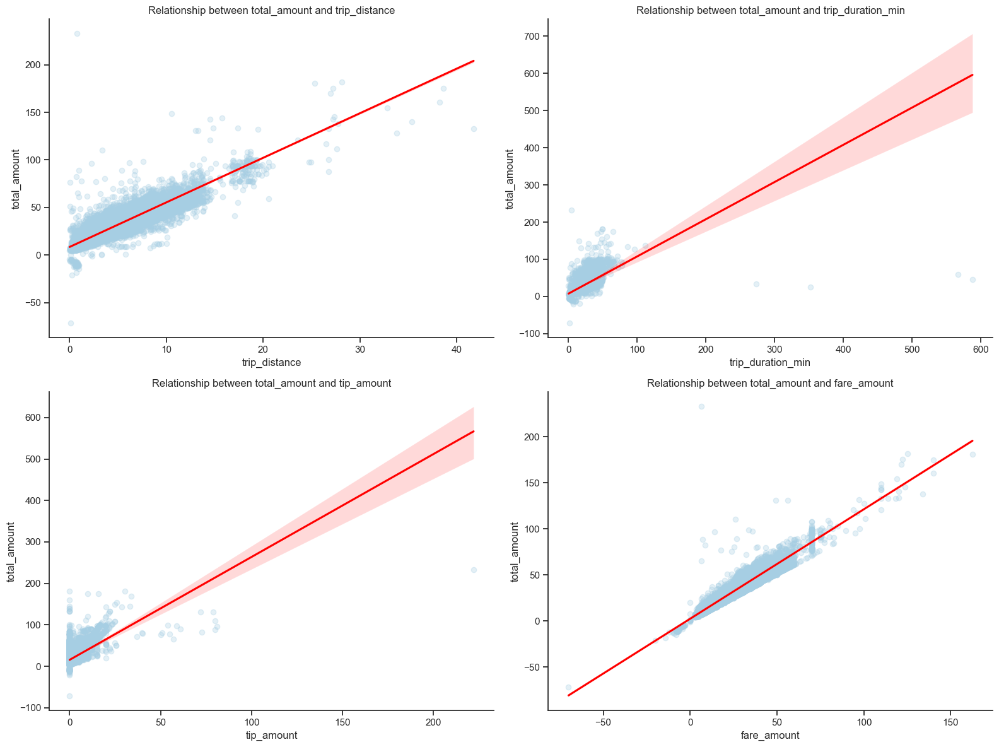

In [53]:
# List of variables to plot against total_amount
variables = ['trip_distance', 'trip_duration_min', 'tip_amount', 'fare_amount']

plt.figure(figsize=(16, 12))

# Create scatter plots with regression lines for each variable
for i, var in enumerate(variables, 1):
    plt.subplot(2, 2, i)
    sns.regplot(x=var, y='total_amount', data=nyc_clean, scatter_kws={'alpha':0.3}, line_kws={'color':'red'})
    plt.title(f'Relationship between total_amount and {var}')
    plt.tight_layout()

plt.show()

Text(0.5, 1.02, 'Trip Metrics vs. Weather')

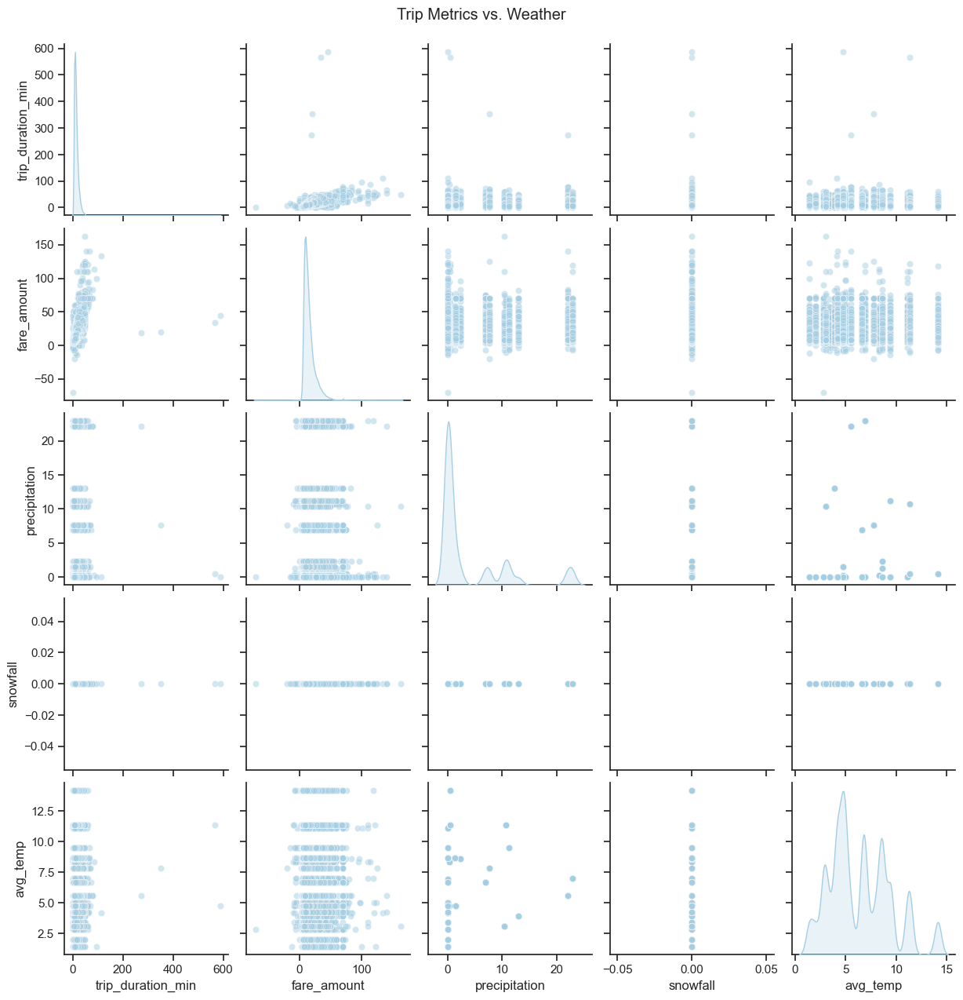

In [54]:
# Plot 3: Scatter Plot Matrix (separate figure due to complexity)
weather_trip_data = nyc_clean[['trip_duration_min', 'fare_amount', 'precipitation', 'snowfall', 'avg_temp']]
sns.pairplot(weather_trip_data, diag_kind='kde', plot_kws={'alpha': 0.5})
plt.suptitle('Trip Metrics vs. Weather', y=1.02)

### 3. **Payment Behavior and Tip Patterns**

#### Do passengers tip more for longer trips or for certain times of the day?

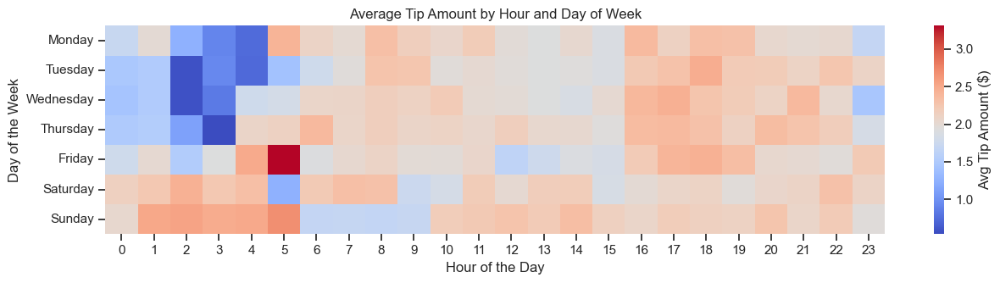

In [55]:
threshold = nyc_clean[nyc_clean['tip_amount'] < 50]  # Example threshold

# Group by day of week and hour, then compute average tip amount
tip_avg = threshold.groupby(['pickup_dayofweek', 'pickup_hour'], as_index=False)['tip_amount'].mean()

# Set day order: only do this if pickup_dayofweek is already in string form (like "Monday", etc.)
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
tip_avg['pickup_dayofweek'] = pd.Categorical(
    tip_avg['pickup_dayofweek'],
    categories=weekday_order,
    ordered=True
)

# Sort values just to ensure correct order in heatmap
tip_avg = tip_avg.sort_values(['pickup_dayofweek', 'pickup_hour']).reset_index(drop=True)

# Create a pivot table for the heatmap
tip_heatmap = pd.pivot_table(
    tip_avg,
    values='tip_amount',
    index='pickup_dayofweek',
    columns='pickup_hour'
)

# Plot the heatmap
fig, ax = plt.subplots(figsize=(13, 3.5))
sns.heatmap(tip_heatmap, cmap='coolwarm', ax=ax, cbar_kws={'label': 'Avg Tip Amount ($)'})

ax.set_ylabel('Day of the Week')
ax.set_xlabel('Hour of the Day')
ax.set_title('Average Tip Amount by Hour and Day of Week')
plt.tight_layout()
plt.show()

(0.0, 20.0)

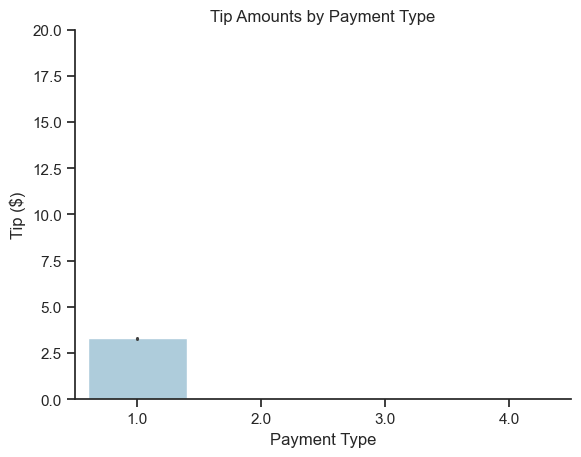

In [56]:
sns.barplot(x='payment_type', y='tip_amount', data=nyc_clean )
plt.title('Tip Amounts by Payment Type')
plt.xlabel('Payment Type')
plt.ylabel('Tip ($)')
plt.ylim(0, 20)

#### How do tip amounts vary by borough?

In [57]:
nyc_clean['tip_pct'] = nyc_clean['tip_amount'] / nyc_clean['fare_amount']

<Axes: xlabel='pickup_borough'>

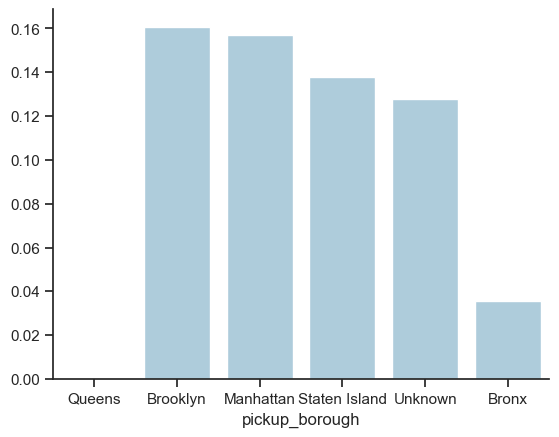

In [58]:
borough_tips = nyc_clean.groupby('pickup_borough')['tip_pct'].mean().sort_values(ascending=False)
sns.barplot(x=borough_tips.index, y=borough_tips.values)

In [59]:
do_tip = nyc_clean.groupby(['DOLocationID'], as_index=False)['tip_amount'].mean()
do_gdf = gpd.GeoDataFrame(pd.merge(do_tip, zone, left_on='DOLocationID', right_on='LocationID')).drop('DOLocationID',axis=1)

# idenitify missing taxi zone
missing_list = list(set(zone['OBJECTID']) - set(do_gdf['OBJECTID']))
missing = zone[zone['OBJECTID'].isin(missing_list)]
missing.insert(0, 'tip_amount', np.nan, True)
missing = missing.drop('LocationID', axis=1)
do_gdf = pd.concat([do_gdf, missing]).reset_index().drop('LocationID', axis=1)
do_gdf = do_gdf.rename({'OBJECTID':'LocationID'}, axis=1)
do_gdf = do_gdf.to_crs(epsg=3857)

In [60]:
pu_tip = nyc_clean.groupby(['PULocationID'], as_index=False)['tip_amount'].mean()
pu_gdf = gpd.GeoDataFrame(pd.merge(pu_tip, zone, left_on='PULocationID', right_on='LocationID')).drop('PULocationID',axis=1)

# idenitify missing taxi zone
missing_list = list(set(zone['OBJECTID']) - set(pu_gdf['OBJECTID']))
missing = zone[zone['OBJECTID'].isin(missing_list)]
missing.insert(0, 'tip_amount', np.nan, True)
missing = missing.drop('LocationID', axis=1)
pu_gdf = pd.concat([pu_gdf, missing]).reset_index().drop('LocationID', axis=1)
pu_gdf = pu_gdf.rename({'OBJECTID':'LocationID'}, axis=1)
pu_gdf = pu_gdf.to_crs(epsg=3857)

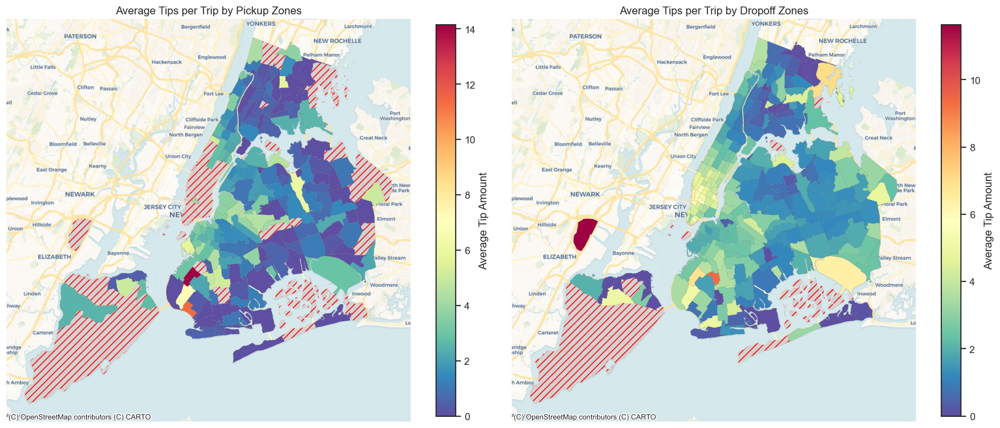

In [61]:
fig, axs = plt.subplots(ncols=2, figsize=(20, 10))
vmin, vmax = pu_gdf['tip_amount'].min(), pu_gdf['tip_amount'].max()
pu_gdf.plot(column='tip_amount', cmap='Spectral_r', linewidth=0.05, ax=axs[0], edgecolor='k',
    legend=True, legend_kwds={'label': "Average Tip Amount", 'shrink': 0.78}, vmin=vmin, vmax=vmax, 
    missing_kwds={"color": "lightgrey", "edgecolor": "red", "hatch": "///", "label": "Missing values"})

vmin, vmax = do_gdf['tip_amount'].min(), do_gdf['tip_amount'].max()
do_gdf.plot(column='tip_amount', cmap='Spectral_r', linewidth=0.05, ax=axs[1], edgecolor='k',
    legend=True, legend_kwds={'label': "Average Tip Amount", 'shrink': 0.78}, vmin=vmin, vmax=vmax,
    missing_kwds={"color": "lightgrey", "edgecolor": "red", "hatch": "///", "label": "Missing values"})

fig.subplots_adjust(wspace=0)
ctx.add_basemap(axs[0], source=ctx.providers.CartoDB.Voyager)
ctx.add_basemap(axs[1], source=ctx.providers.CartoDB.Voyager)
axs[0].set_axis_off()
axs[1].set_axis_off()
axs[0].set_title("Average Tips per Trip by Pickup Zones")
axs[1].set_title("Average Tips per Trip by Dropoff Zones")

# Remove the border of the color bar
cb.outline.set_visible(False)

plt.show()

#### Does trip distance or duration affect tip behavior?

<Axes: xlabel='trip_distance', ylabel='tip_pct'>

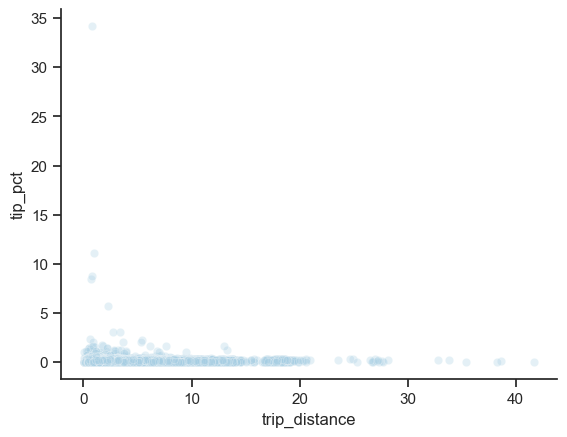

In [62]:
sns.scatterplot(x='trip_distance', y='tip_pct', data=nyc_clean, alpha=0.3)